<a href="https://colab.research.google.com/github/Tasnia16EEE/NYC-BIC-Violations-Data-Analysis-Report/blob/main/BICViolationdataanalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importing Library

In [9]:
!pip install folium
import folium
from folium.plugins import MarkerCluster


In [13]:
!pip install folium plotly


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster, HeatMap
import plotly.express as px
import plotly.graph_objs as go


## Loading Dataset

In [2]:
url = "https://data.cityofnewyork.us/api/views/upii-frjc/rows.csv?accessType=DOWNLOAD"
df = pd.read_csv(url)


## Data Cleaning

In [3]:
# Check structure
df.info()

# Convert dates
df['DATE OF VIOLATION'] = pd.to_datetime(df['DATE OF VIOLATION'], errors='coerce')
df['DATE FINE PAID'] = pd.to_datetime(df['DATE FINE PAID'], errors='coerce')

# Replace missing BIC NUMBER with 'Unlicensed'
df['BIC NUMBER'].fillna('Unlicensed', inplace=True)

# Ensure fine columns are numeric
df['FINE AMOUNT'] = pd.to_numeric(df['FINE AMOUNT'], errors='coerce')


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15489 entries, 0 to 15488
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   VIOLATION NUMBER            15489 non-null  object 
 1   BIC NUMBER                  8134 non-null   float64
 2   ACCOUNT NAME                15489 non-null  object 
 3   TYPE OF VIOLATION           15489 non-null  object 
 4   VIOLATION PHASE             15489 non-null  object 
 5   VIOLATION DISPOSITION       15489 non-null  object 
 6   ACCOUNT TYPE                15489 non-null  object 
 7   VIOLATION ACCOUNT ADDRESS   15276 non-null  object 
 8   VIOLATION ACCOUNT CITY      15271 non-null  object 
 9   VIOLATION ACCOUNT STATE     15275 non-null  object 
 10  VIOLATION ACCOUNT POSTCODE  15266 non-null  object 
 11  BOROUGH OF VIOLATION        14269 non-null  object 
 12  DATE OF VIOLATION           15489 non-null  object 
 13  DATE VIOLATION ISSUED       154

<ipython-input-3-1496380713>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['BIC NUMBER'].fillna('Unlicensed', inplace=True)
<ipython-input-3-1496380713>:9: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Unlicensed' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df['BIC NUMBER'].fillna('Unlicensed', inplace=True)


## Descriptive Analysis

In [4]:
total_fine = df['FINE AMOUNT'].sum()
print(f"Total Fines Issued: ${total_fine:,.2f}")


Total Fines Issued: $32,890,382.89


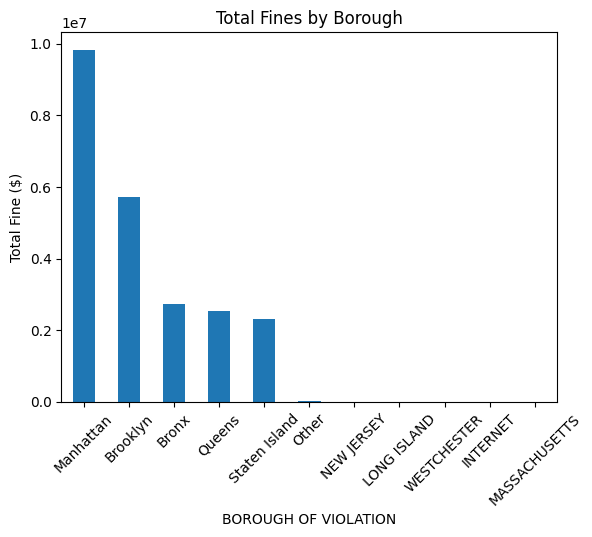

In [5]:
fines_by_borough = df.groupby('BOROUGH OF VIOLATION')['FINE AMOUNT'].sum().sort_values(ascending=False)
fines_by_borough.plot(kind='bar', title='Total Fines by Borough')
plt.ylabel("Total Fine ($)")
plt.xticks(rotation=45)
plt.show()


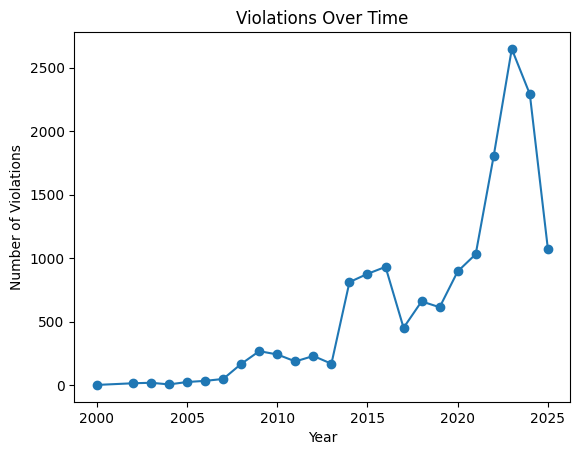

In [6]:
df['Year'] = df['DATE OF VIOLATION'].dt.year
violations_by_year = df.groupby('Year').size()
violations_by_year.plot(kind='line', marker='o', title='Violations Over Time')
plt.ylabel("Number of Violations")
plt.show()


## Business Analysis

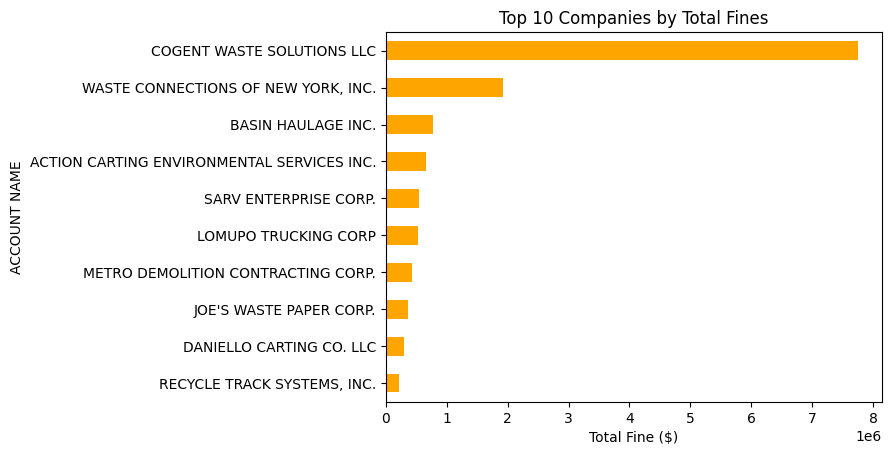

In [7]:
top_companies = df.groupby('ACCOUNT NAME')['FINE AMOUNT'].sum().sort_values(ascending=False).head(10)
top_companies.plot(kind='barh', title='Top 10 Companies by Total Fines', color='orange')
plt.xlabel("Total Fine ($)")
plt.gca().invert_yaxis()
plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


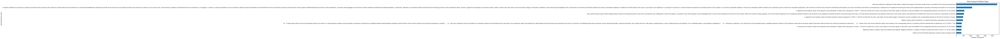

In [8]:
top_rules = df['DESCRIPTION OF RULE'].value_counts().head(10)
top_rules.plot(kind='barh', title='Most Frequent Violation Types')
plt.xlabel("Number of Violations")
plt.gca().invert_yaxis()
plt.show()


## Geospatial Analysis

### Clean and Filter Geo Data

In [10]:
# Drop rows with missing lat/lon
geo_df = df.dropna(subset=['Latitude', 'Longitude'])

# Optional: Focus on more recent violations (e.g., after 2020)
geo_df = geo_df[geo_df['DATE OF VIOLATION'].dt.year >= 2020]

# Reset index
geo_df = geo_df.reset_index(drop=True)


### Create The Base Map of NYC

In [11]:
# Center the map on NYC
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Add cluster of violation markers
marker_cluster = MarkerCluster().add_to(nyc_map)

for i, row in geo_df.iterrows():
    popup_text = f"""
    <b>Business:</b> {row['ACCOUNT NAME']}<br>
    <b>Violation:</b> {row['DESCRIPTION OF RULE']}<br>
    <b>Fine:</b> ${row['FINE AMOUNT']}<br>
    <b>Date:</b> {row['DATE OF VIOLATION'].date()}<br>
    <b>Borough:</b> {row['BOROUGH OF VIOLATION']}
    """
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=popup_text,
        icon=folium.Icon(color='red', icon='exclamation-sign')
    ).add_to(marker_cluster)

nyc_map


### A heatmap showing areas with frequent violations

In [12]:
from folium.plugins import HeatMap

heat_data = geo_df[['Latitude', 'Longitude']].dropna().values.tolist()

nyc_heatmap = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
HeatMap(heat_data).add_to(nyc_heatmap)

nyc_heatmap


## Creating Dashboard

In [15]:
top_companies = df.groupby('ACCOUNT NAME')['FINE AMOUNT'].sum().sort_values(ascending=False).head(10)
fig1 = px.bar(top_companies, orientation='h', title="Top 10 Companies by Total Fines", labels={'value':'Total Fine ($)', 'ACCOUNT NAME':'Business'})
fig1.update_layout(yaxis=dict(autorange="reversed"))
fig1.show()

df['Year'] = df['DATE OF VIOLATION'].dt.year
violations_by_year = df.groupby('Year').size().reset_index(name='Counts')
fig2 = px.line(violations_by_year, x='Year', y='Counts', title='Violations Over Time')
fig2.show()

borough_fines = df.groupby('BOROUGH OF VIOLATION')['FINE AMOUNT'].sum().sort_values(ascending=False)
fig3 = px.bar(borough_fines, title="Total Fines by Borough", labels={'value':'Fine Amount ($)', 'index':'Borough'})
fig3.show()

cluster_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
marker_cluster = MarkerCluster().add_to(cluster_map)

for _, row in geo_df.iterrows():
    popup_text = f"<b>{row['ACCOUNT NAME']}</b><br>{row['DESCRIPTION OF RULE']}<br><b>Fine:</b> ${row['FINE AMOUNT']}<br><b>Date:</b> {row['DATE OF VIOLATION'].date()}"
    folium.Marker([row['Latitude'], row['Longitude']], popup=popup_text).add_to(marker_cluster)
cluster_map.save("cluster_map.html")


heat_data = geo_df[['Latitude', 'Longitude']].dropna().values.tolist()
heatmap = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
HeatMap(heat_data).add_to(heatmap)
heatmap.save("heatmap.html")


In [16]:
html_content = """
<h1>BIC Issued Violations Dashboard</h1>
<h2>Interactive Charts</h2>
<ul>
  <li><a href="#chart1">Top Fined Companies</a></li>
  <li><a href="#chart2">Violations Over Time</a></li>
  <li><a href="#chart3">Fines by Borough</a></li>
</ul>

<h2>Interactive Maps</h2>
<ul>
  <li><a href="cluster_map.html" target="_blank">Cluster Map</a></li>
  <li><a href="heatmap.html" target="_blank">Heat Map</a></li>
</ul>
"""

# Save the dashboard
with open("dashboard.html", "w") as f:
    f.write(html_content)


In [17]:
from google.colab import files
files.download("dashboard.html")
files.download("cluster_map.html")
files.download("heatmap.html")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>